# Mask R-CNN Demo

A quick intro to using the pre-trained model to detect and segment objects.

In [1]:
import sys
sys.path.remove('/opt/ros/kinetic/lib/python2.7/dist-packages')

ValueError: list.remove(x): x not in list

In [3]:
import os
import sys
import random
import math
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt
import time

# Root directory of the project
ROOT_DIR = os.path.abspath("../")
# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log
# Import COCO config
sys.path.append(os.path.join(ROOT_DIR, "samples/coco/"))  # To find local version
import coco2 as coco


%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
## COCO
# COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco_0153_0.21416.h5")
## LEGO
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco_0014_0.32497.h5")
# Download COCO trained weights from Releases if needed
# if not os.path.exists(COCO_MODEL_PATH):
#     utils.download_trained_weights(COCO_MODEL_PATH)

## Configurations

We'll be using a model trained on the MS-COCO dataset. The configurations of this model are in the ```CocoConfig``` class in ```coco.py```.

For inferencing, modify the configurations a bit to fit the task. To do so, sub-class the ```CocoConfig``` class and override the attributes you need to change.

In [4]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 4
#     NUM_CLASSES = 1 + 19

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                17
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_bbox_loss': 1.0, 'rpn_class_loss': 1.0, 'mrcnn_mask_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTA

## Create Model and Load Trained Weights

In [5]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

# Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True)

In [6]:
# COCO_DIR = os.path.join(ROOT_DIR, "masks/")
# dataset = coco.CocoDataset()
# dataset.load_coco(COCO_DIR, "val")
# dataset.prepare()
# print(dataset.class_names)

## Class Names

The model classifies objects and returns class IDs, which are integer value that identify each class. Some datasets assign integer values to their classes and some don't. For example, in the MS-COCO dataset, the 'person' class is 1 and 'teddy bear' is 88. The IDs are often sequential, but not always. The COCO dataset, for example, has classes associated with class IDs 70 and 72, but not 71.

To improve consistency, and to support training on data from multiple sources at the same time, our ```Dataset``` class assigns it's own sequential integer IDs to each class. For example, if you load the COCO dataset using our ```Dataset``` class, the 'person' class would get class ID = 1 (just like COCO) and the 'teddy bear' class is 78 (different from COCO). Keep that in mind when mapping class IDs to class names.

To get the list of class names, you'd load the dataset and then use the ```class_names``` property like this.
```
# Load COCO dataset
dataset = coco.CocoDataset()
dataset.load_coco(COCO_DIR, "train")
dataset.prepare()

# Print class names
print(dataset.class_names)
```

We don't want to require you to download the COCO dataset just to run this demo, so we're including the list of class names below. The index of the class name in the list represent its ID (first class is 0, second is 1, third is 2, ...etc.)

# COCO Class names
Index of the class in the list is its ID. For example, to get ID of the teddy bear class, use: class_names.index('teddy bear')
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [7]:
class_names = ["BG", "Red", "Blue", "Yellow", "Banana"]

In [5]:
class_names = ["BG","Glade",
                "Blue_Bottle",
                "Plant_Food",
                "Canned_Soup",
                "Jello",
                "Pepper",
                "Espresso",
                "Melatonin",
                "Agar",
                "Milano",
                "Apple",
                "Orange",
                "Shampoo",
                "Gushers",
                "Pringles",
                "Dried_Mangos",
                "Face_Wash",
                "Tropicana",
                "Ramen"]

## Run object detection on images from HSR

left0046.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.3857741355895996


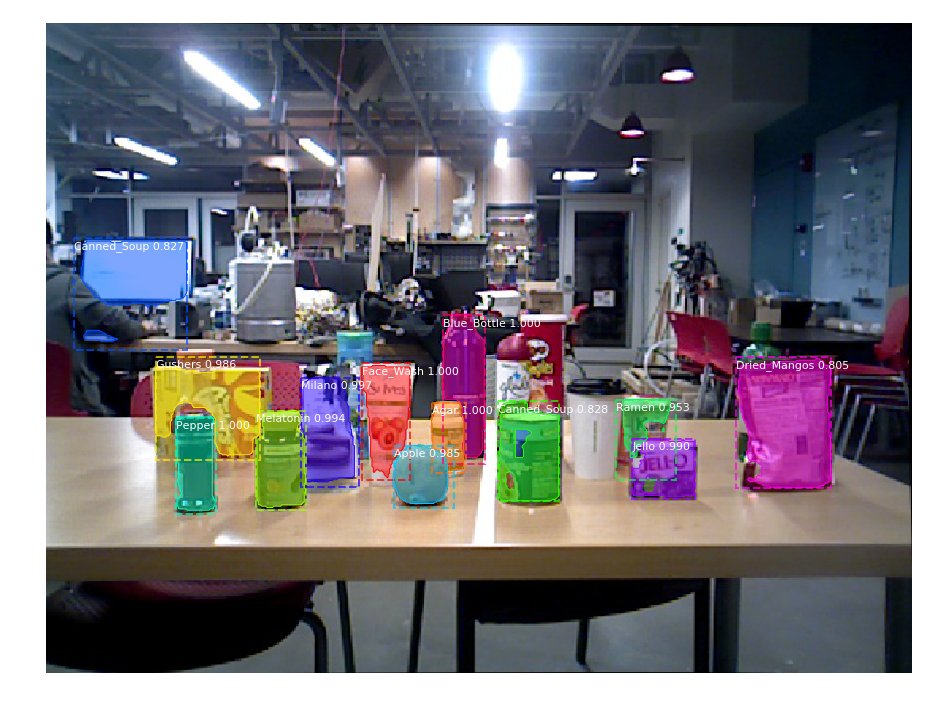

left0024.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.386993408203125


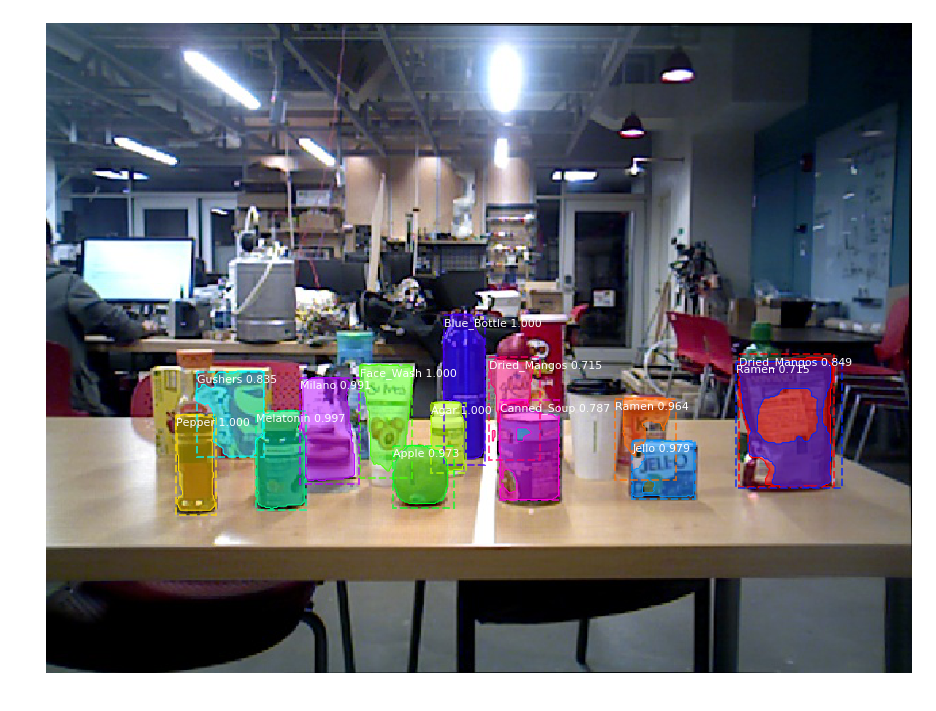

left0036.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.35883331298828125


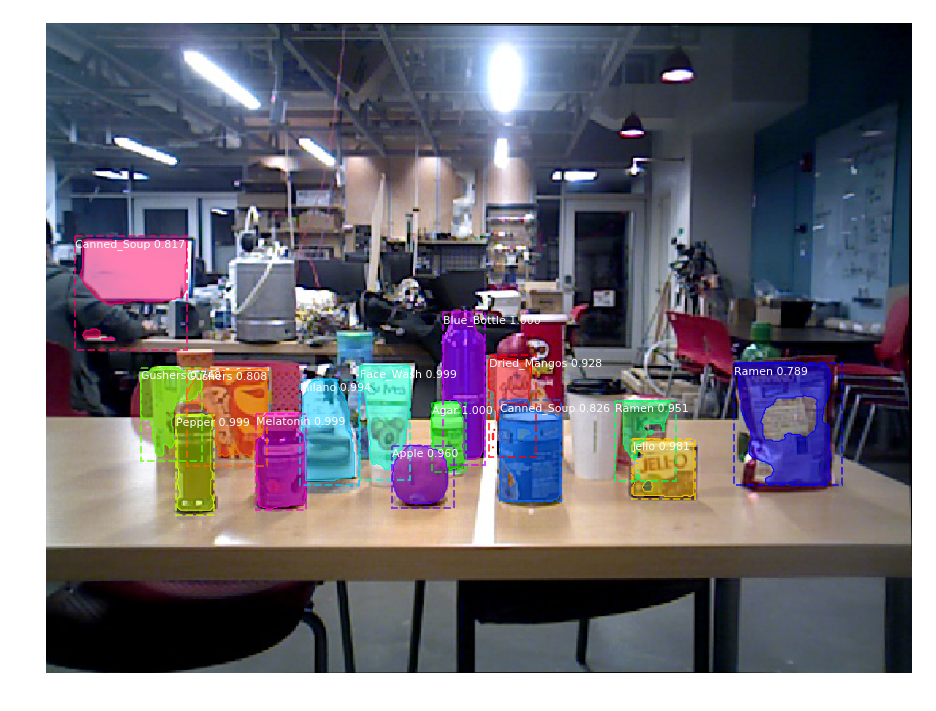

left0011.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.3909270763397217


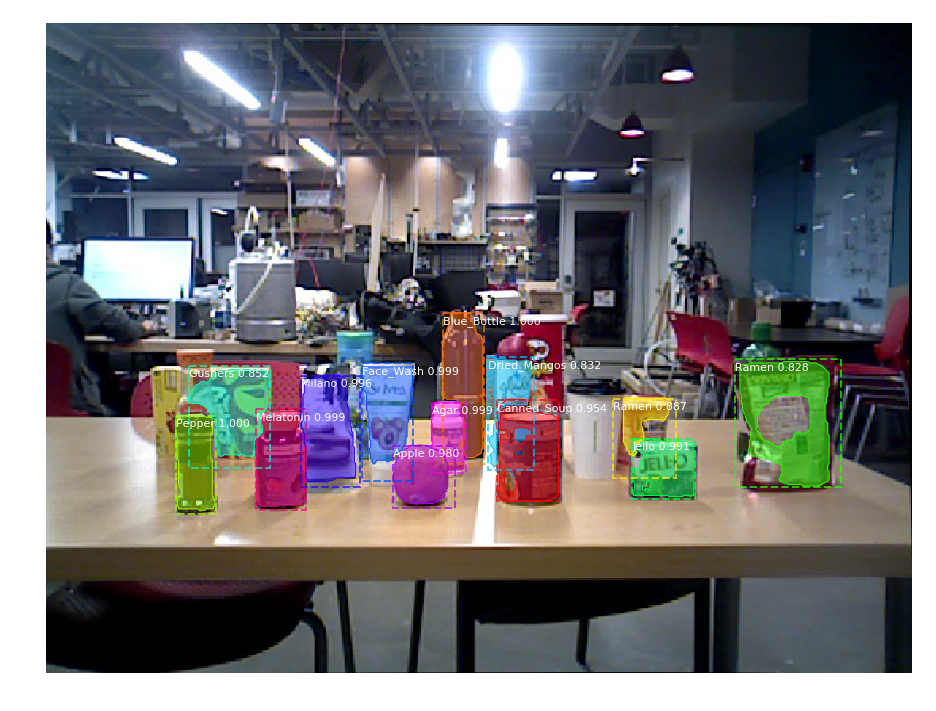

left0002.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.3901631832122803


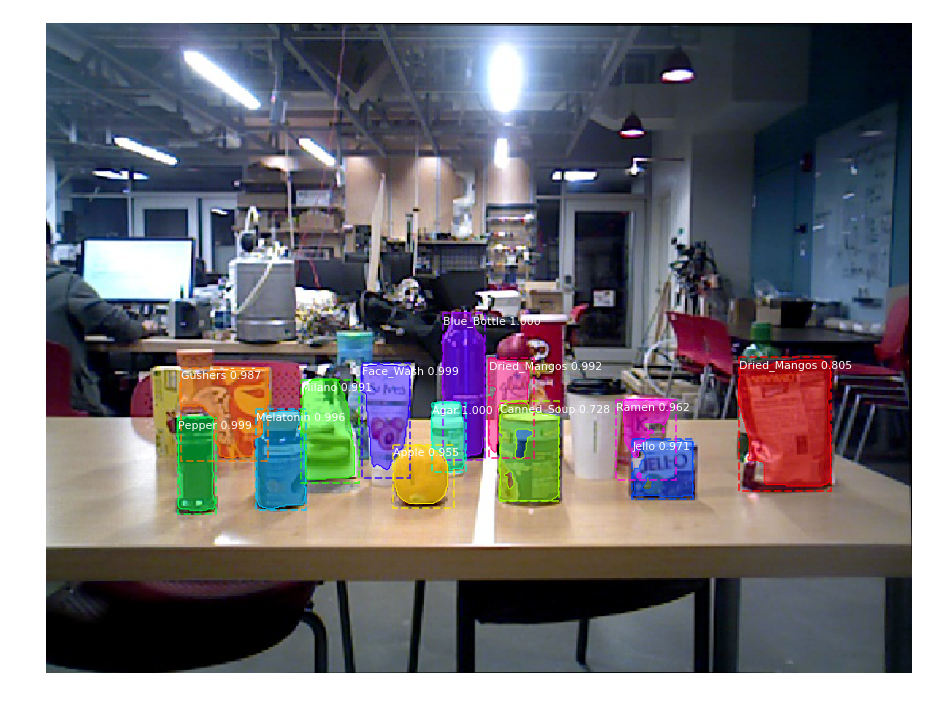

left0031.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.3930230140686035


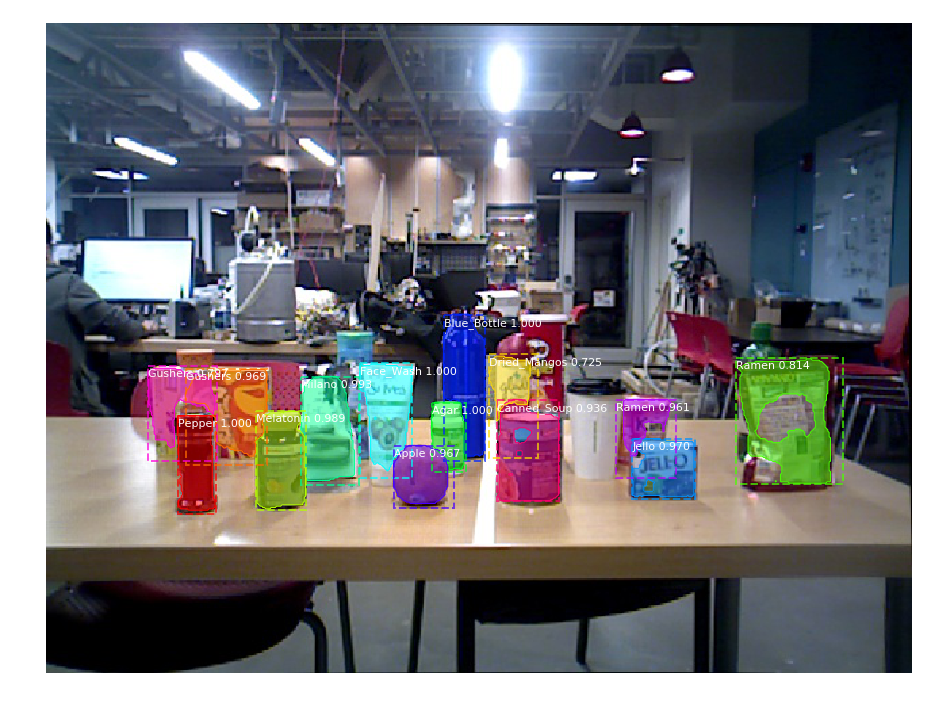

left0034.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.4004526138305664


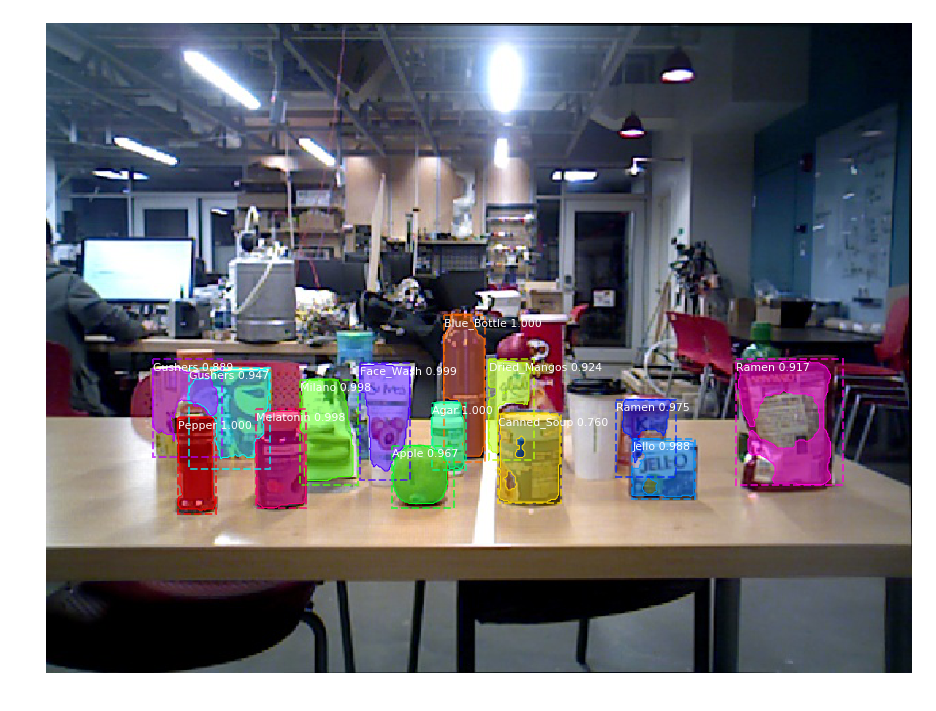

left0051.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.393906831741333


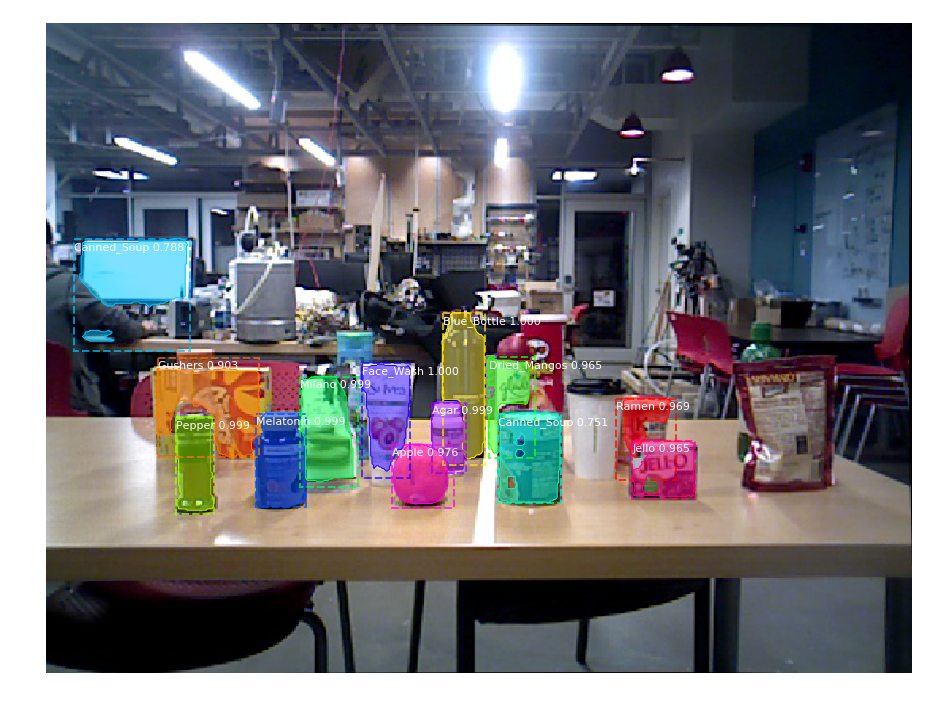

left0042.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.39679956436157227


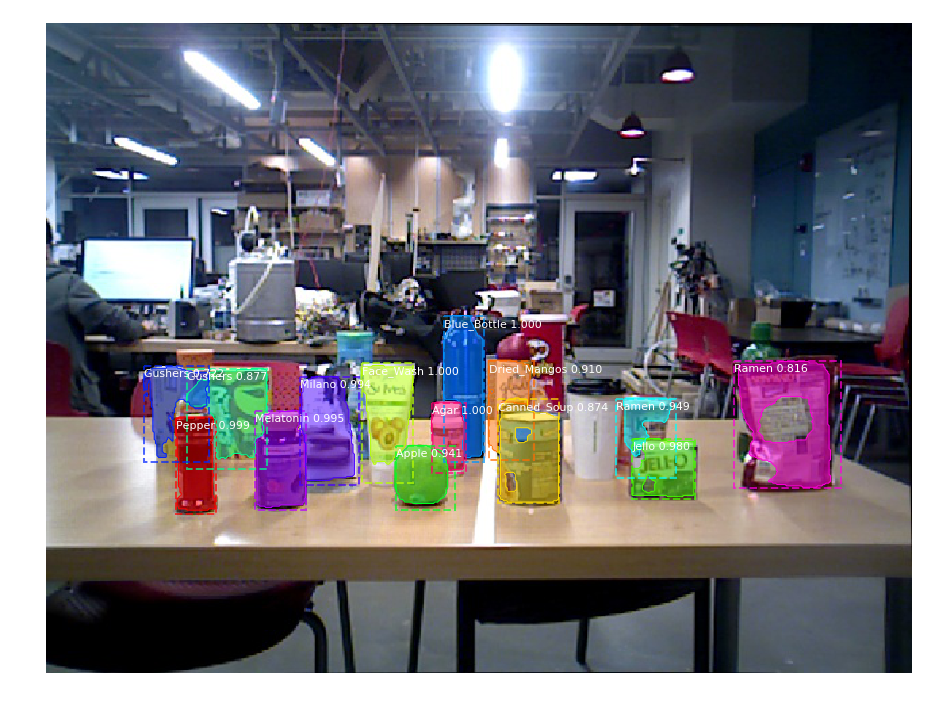

left0001.jpg
/home/naoki/jo_dev/tabletop_images/rgbd/side_view
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 32)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.3850266933441162


In [ ]:
img_folder = "/home/naoki/jo_dev/tabletop_images"
for cameras in os.listdir(img_folder):
    for views in os.listdir(os.path.join(img_folder, cameras)):
        IMAGE_DIR = os.path.join(img_folder, cameras, views)
        for imgs in os.listdir(IMAGE_DIR):
            if imgs.endswith(".jpg"):
                print(imgs)
                print(IMAGE_DIR)
                DETECTED_IMGS_FOLDER = os.path.join(ROOT_DIR, "DETECTIONS", COCO_MODEL_PATH.split("/")[-1], cameras + "_" + views)
                if not os.path.exists(DETECTED_IMGS_FOLDER):
                    os.makedirs(DETECTED_IMGS_FOLDER)
                log_name = os.path.join(DETECTED_IMGS_FOLDER, imgs)
                image = skimage.io.imread(os.path.join(IMAGE_DIR, imgs))

                # Run detection
                start_time = time.time()
                results = model.detect([image], verbose=1)
                elapsed_time = time.time() - start_time
                print("Elapsed time: ", elapsed_time)

                # Visualize results
                r = results[0]
                visualize.display_instances(log_name, image, r['rois'], r['masks'], r['class_ids'], 
                                            class_names, r['scores'])

Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.37996864318847656


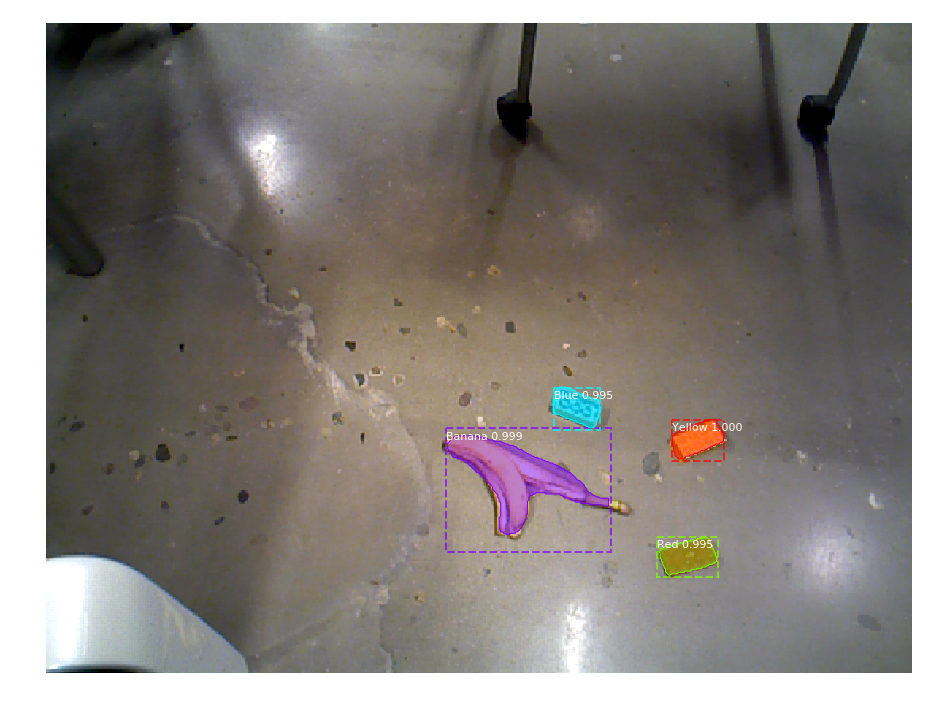

Processing 1 images
image                    shape: (960, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.3922872543334961


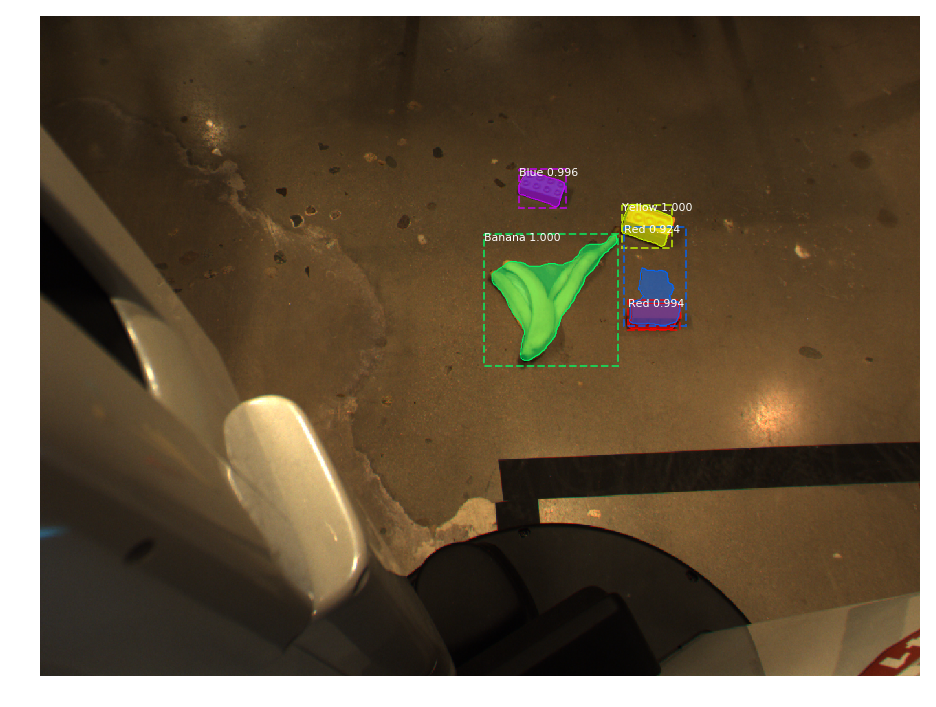

Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.34113383293151855


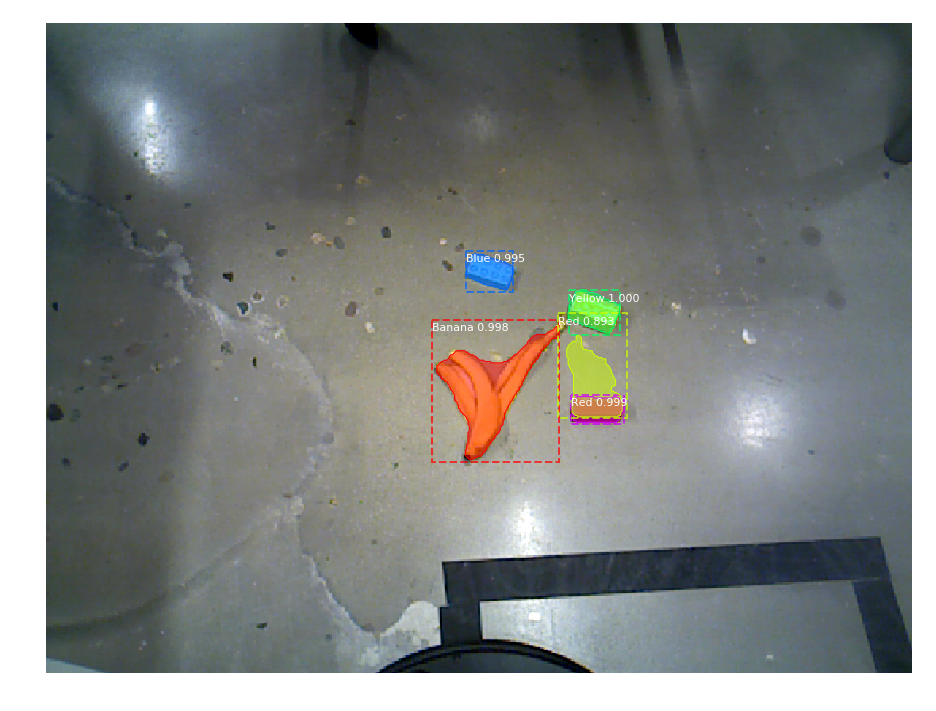

Processing 1 images
image                    shape: (960, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.3601415157318115


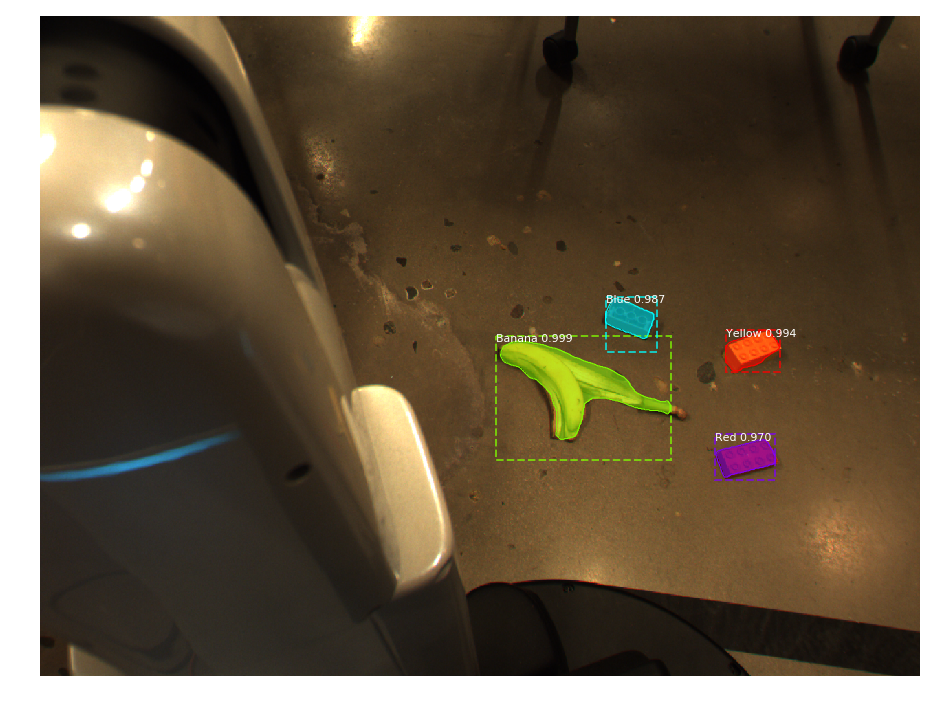

Processing 1 images
image                    shape: (960, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.38156557083129883


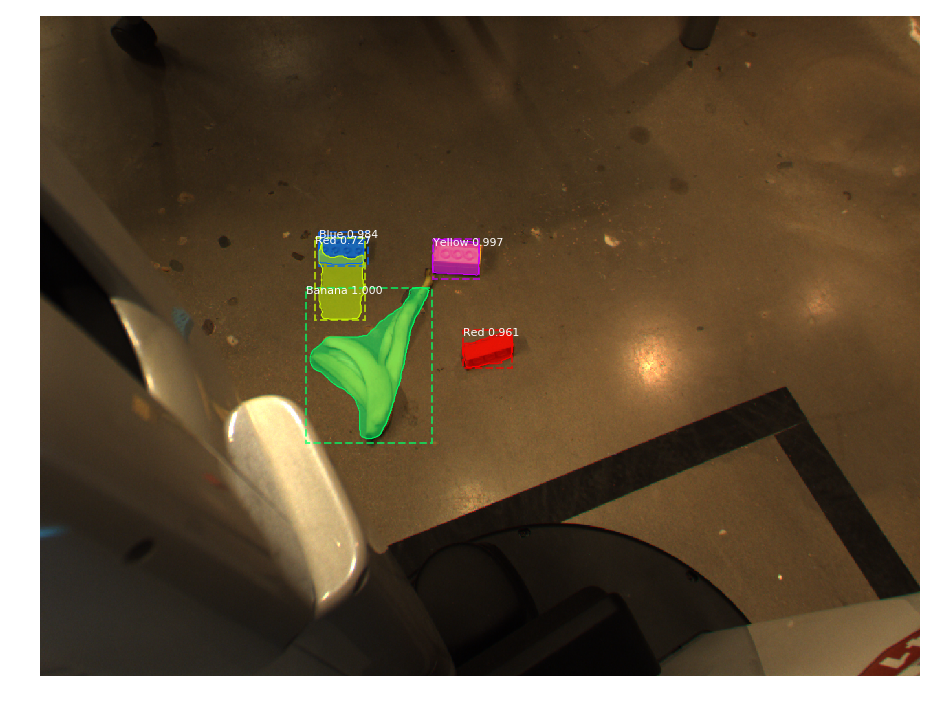

Processing 1 images
image                    shape: (960, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.35019350051879883


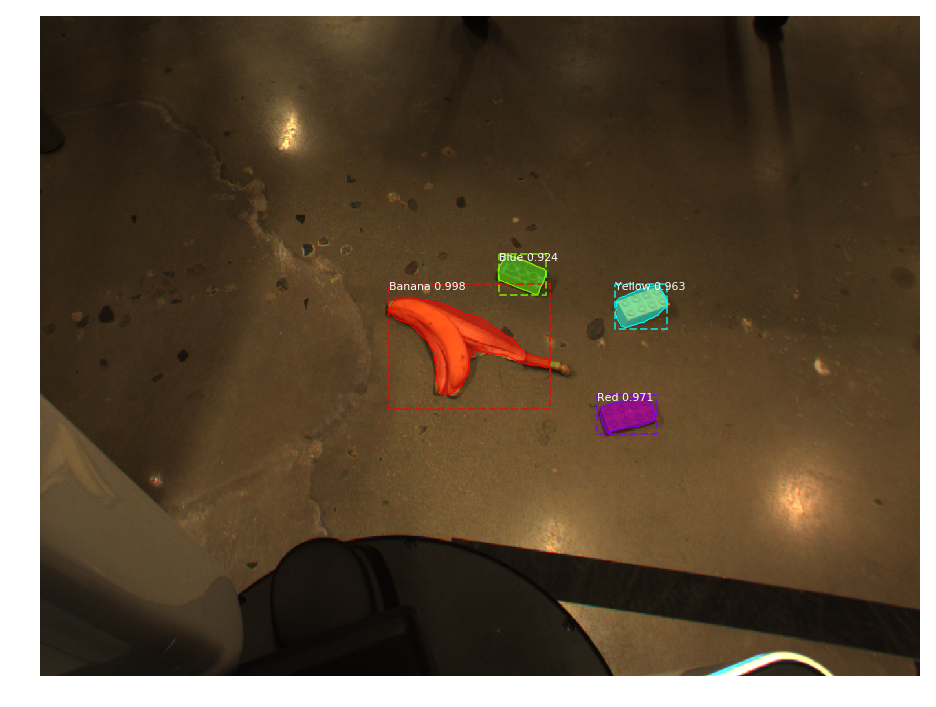

Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.34175562858581543


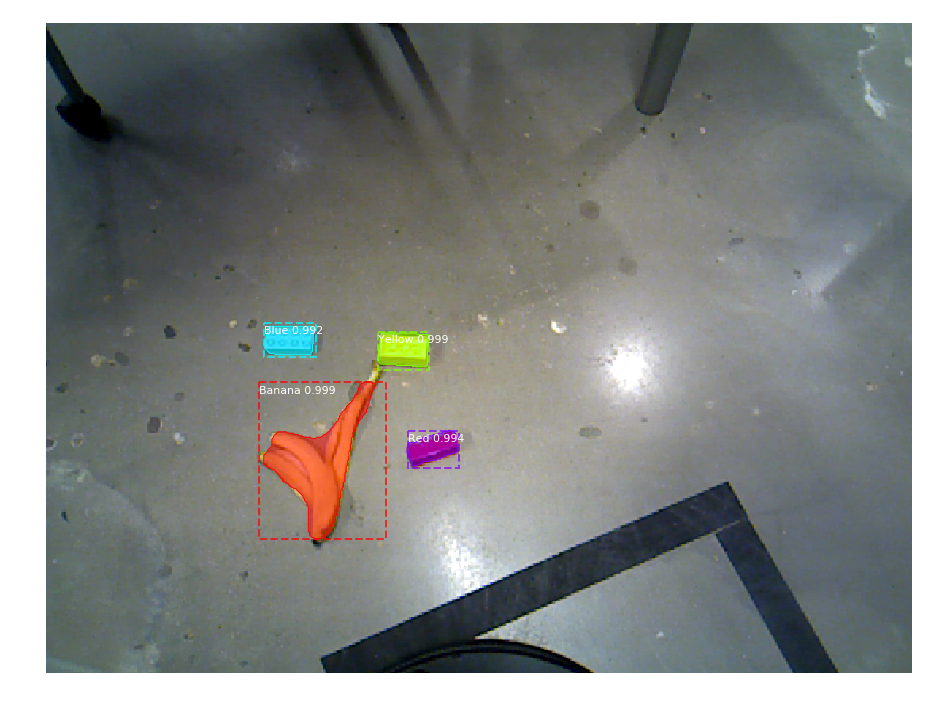

Processing 1 images
image                    shape: (960, 1280, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
Elapsed time:  0.3765082359313965


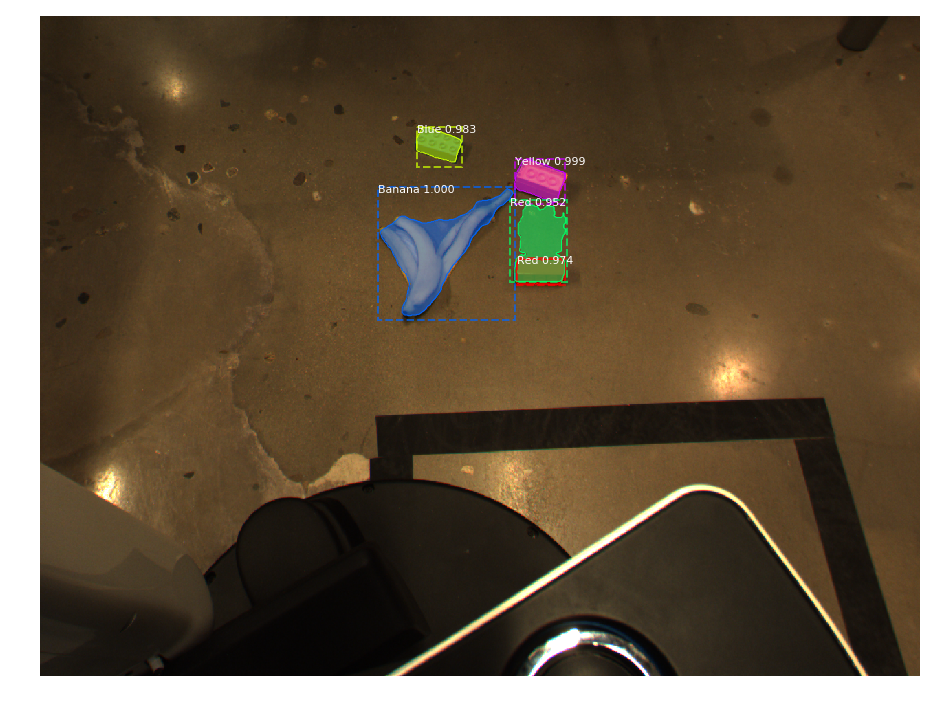

In [14]:
# Directory of images to run detection on
IMAGE_DIR = img_folder = "/home/naoki/jo_dev/lego_imgs"

# Load a random image from the images folder
file_names = next(os.walk(IMAGE_DIR))[2]
for file in file_names:
    log_name = os.path.join(ROOT_DIR, "DETECTIONS/lego_imgs/", file)
    image = skimage.io.imread(os.path.join(IMAGE_DIR, file))

    # Run detection
    start_time = time.time()
    results = model.detect([image], verbose=1)
    elapsed_time = time.time() - start_time
    print("Elapsed time: ", elapsed_time)

    # Visualize results
    r = results[0]
    visualize.display_instances(log_name, image, r['rois'], r['masks'], r['class_ids'], 
                                class_names, r['scores'])

## Run Object Detection

Processing 1 images
image                    shape: (2912, 3882, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 17)               min:    0.00000  max: 3882.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



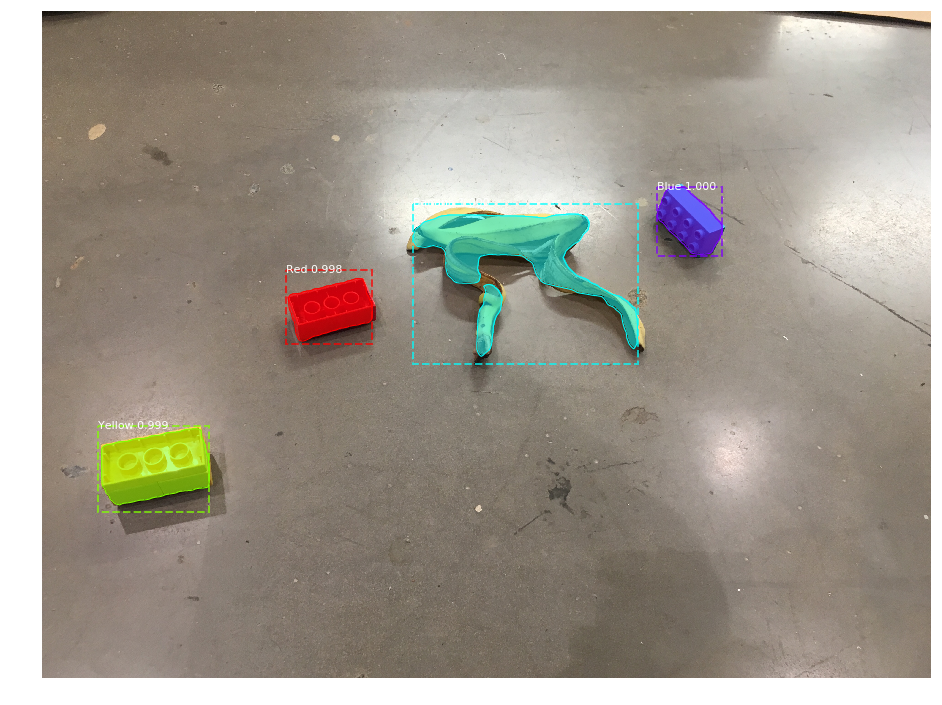

--- Logging error ---
--- Logging error ---
--- Logging error ---
--- Logging error ---
--- Logging error ---
Error in sys.excepthook:
Traceback (most recent call last):
  File "/usr/lib/python3.5/linecache.py", line 95, in updatecache
    stat = os.stat(fullname)
NotADirectoryError: [Errno 20] Not a directory: '/usr/local/lib/python3.5/dist-packages/mask_rcnn-2.1-py3.5.egg/mrcnn/visualize.py'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.5/linecache.py", line 47, in getlines
    return updatecache(filename, module_globals)
  File "/usr/lib/python3.5/linecache.py", line 103, in updatecache
    data = cache[filename][0]()
zlib.error: Error -5 while decompressing data: incomplete or truncated stream

Original exception was:
Traceback (most recent call last):
  File "/usr/local/lib/python3.5/dist-packages/ipython-7.0.0b1-py3.5.egg/IPython/core/interactiveshell.py", line 3265, in run_code
    exec(code_obj,

In [ ]:
# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "TEST")

# Load a random image from the images folder
file_names = next(os.walk(IMAGE_DIR))[2]
for file in file_names:
    log_name = os.path.join(ROOT_DIR, "DETECTIONS/rgbd_top/", file)
    image = skimage.io.imread(os.path.join(IMAGE_DIR, file))

    # Run detection
    results = model.detect([image], verbose=1)

    # Visualize results
    r = results[0]
    visualize.display_instances(log_name, image, r['rois'], r['masks'], r['class_ids'], 
                                class_names, r['scores'])